## <img src="deepcyc-logo.png" alt="DeepCyc logo" style="height: 30px; display: inline"/> DeepCyc API - Basic Tutorial

### Introduction
DeepCyc is Reak's Global Probabilistic Hazard Model, which offers a comprehensive and high-resolution assessment of tropical cyclone risk worldwide.

In this notebook, we will provide a basic tutorial on utilizing Reask's Python client API to access and retrieve data from DeepCyc. The Python client API serves as an interface through which users can interact with DeepCyc and obtain valuable insights into tropical cyclone hazards. By following this tutorial, you will gain a better understanding of the functionalities and capabilities of the Reask Python client API, enabling you to effectively leverage DeepCyc data for your specific needs.

### Required Packages

Prior to beginning, it is necessary to import the essential system and third-party packages that are required to execute the code in this Jupyter notebook. These packages provide additional functionalities and resources that will be utilized throughout the notebook.

In [39]:
import pandas as pd
import geopandas as gpd
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import sys

from folium import Circle, GeoJson, Map, Marker, Polygon, PolyLine
from folium.plugins.fast_marker_cluster import FastMarkerCluster
from pathlib import Path

Additionally, please ensure that the project root is added to the Python path by executing the following code:

In [40]:
# Add project root to the path
current_path = Path(os.path.abspath('.'))
sys.path.append(str(current_path.parent.parent))

By importing these packages and adding the project root to the Python path, you will have access to the necessary functionalities and resources needed for running the code in this notebook.

### DeepCyc client
Reask API client offers Python classes that streamline the procedure of interacting with Reask API servers.

To utilize the client, simply import it from the `reaskapi` package and create a new instance of the DeepCyc object.

During instantiation, DeepCyc will authenticate with the Reask API by utilizing the credentials stored in your credentials file located at `${HOME}/.reask`. The authentication token will be stored in memory for future use.

Follow the steps below to initialize the DeepCyc client:

1. Import the `DeepCyc` client from the `reaskapi.deepcyc` module.
2. Create a new instance of the `DeepCyc` object.

In [73]:
from reaskapi.deepcyc import DeepCyc

# Initialize DeepCyc client
deepcyc_client = DeepCyc()

2023-06-15 15:26:00,477 - INFO - reaskapi.auth:31 - Authenticating


### Point method

The most basic way to query the DeepCyc API is by providing the geographical coordinates of a point of interest.

In this tutorial, we will keep it simple and use the default options for epoch, terrain correction, and wind averaging parameters.

The point method accepts several parameters that we will explore in other tutorial. These parameters allow you to customize the query according to your specific requirements. Here are the available parameters:

- `epoch`: Specifies the time period for which you want to retrieve data. The default value is set to 'Present Day'.
- `units`: Defines the units in which the wind speeds will be returned. The default value is 'kph' (kilometers per hour), but you can also choose 'mph' (miles per hour).
- `terrain_correction`: Specifies the type of terrain correction to apply to the wind speeds. The default value is 'FT_GUST', which stands for Full Terrain 3-second Gust correction. Other options include 'OT' (Open Terrain), 'OW' (Open Water), and 'NT' (No Terrain).
- `wind_averaging`: Defines the time interval over which the wind speeds are averaged. The default value is '3-second', but you can also select '1-minute'.

The code snippet below demonstrates how to utilize the client to query an arbitrary location in Alabama.

In [53]:
lat_point = [31.69]
lon_point = [-85.17]

results_point = deepcyc_client.point(lat_point, lon_point)

2023-06-15 14:47:21,913 - INFO - reaskapi.api_client:56 - querying deepcyc/point took 5567ms


By executing this code, you will obtain the results for the specified latitude and longitude coordinates using the point method of the DeepCyc client.

The results_point variable will store the retrieved information, allowing you to further analyze and utilize the data as needed.

Let's print the returned results and take a quick look at its structure:

In [54]:
print(results_point)

{'features': [{'geometry': {'coordinates': [[[-85.17578125, 31.689453125], [-85.17578125, 31.69921875], [-85.166015625, 31.69921875], [-85.166015625, 31.689453125], [-85.17578125, 31.689453125]]], 'type': 'Polygon'}, 'properties': {'cell_id': 459390446, 'event_ids': ['4ad9e351100320be95ab', 'cd754b8f49cff82ea7ad', '6e01d0c423840a99d898', 'ce83566f22092685fd81', '8ac4cb3c565001ea9596', '838a5c4536ba9fb20ec2', '83c6b4c0e548f585944c', '5ed2f0d3197b7892f173', 'c1fbdfe2b3d098b9d85b', '1ad7e4605334f3aefc18', '6cc4b80f824e17c8c6c6', '03f013f0e87db08e2831', '3997b10cd4c871564f42', 'cd73fc4d089cd8af04b8', '3c5ba59a9c3c6a565b43', '5643a9366a021d5f1512', '464c8d10e84409c6378b', 'a023966c276ff59456a0', '45026b9ed2daa53b1c11', '394c882025e054ded9e5', '09b613972ad49dd89552', 'e0897dd91e8127063c64', 'f1159737d8955214d294', '01d7fc120a7abecbfab4', 'db54c9c446fbbec76a1d', '3d91230ec0a922f7be19', '050d27be503c87cde9bf', '2c816927f29f838e7e21', 'c935fdc4c77c26796226', '04aba126aceed836cb3a', '971614e7809

The results_point variable contains a [GeoJSON](https://en.wikipedia.org/wiki/GeoJSON)  containing geographical features and their corresponding properties.

The geometry feature is a rectangle representing the corresponding Reask 1km resolution grid pixel of the provided location.

Under each feature property in the results, you will find the following attributes:

- `cell_id`: Reask's global high-resolution cell identifier
- `event_ids`: a list of event identifiers
- `latitude`: the requested latitude
- `longitude`: the requested longitude
- `windspeeds`: a list of wind speeds
- `year_ids`: a list of year identifiers

By printing and examining the `results_point variable`, you can gain a better understanding of the structure and contents of the retrieved data. This will help you further analyze and utilize the information for your specific requirements.

The results obtained from DeepCyc API are in the form of a GeoJSON object, which can be converted to a data frame using the GeoPandas library. Here's how you can convert the results to a GeoDataFrame:

The results are a GeoJSON object that can be converted to a data frame using GeoPandas

In [56]:
# Convert results to GeoDataFrame
df_point = gpd.GeoDataFrame.from_features(results_point).set_index('cell_id')

df_point

,geometry,event_ids,latitude,longitude,windspeeds,year_ids
cell_id,,,,,,
459390446,"POLYGON ((-85.17578 31.68945, -85.17578 31.699...","[4ad9e351100320be95ab, cd754b8f49cff82ea7ad, 6...",31.69,-85.17,"[239.0, 232.0, 228.0, 219.0, 218.0, 216.0, 205...","[2005_0621_RAN, 2015_0225_RAN, 2011_0396_RAN, ..."


By using the from_features method of GeoDataFrame and passing the `results_point` variable, we can create a GeoDataFrame. Setting the index to `cell_id` allows for easier indexing and referencing of the data.

To visualize the wind distribution over the years, we can create a box plot using the wind speeds from the GeoDataFrame. Here's the code to plot the box plot:

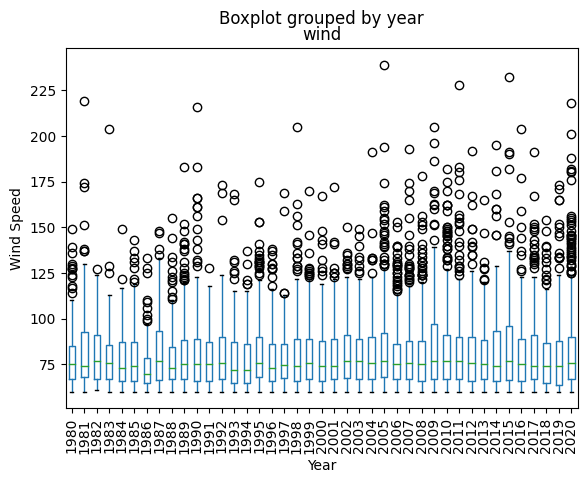

In [57]:
point_winds = df_point.iloc[0]['windspeeds']
point_years = [int(y[0:4]) for y in df_point.iloc[0]['year_ids']]

# Create a DataFrame with wind speeds and corresponding years
df_winds = pd.DataFrame({'wind': point_winds, 'year': point_years})

# Plot the box plot
ax = df_winds.boxplot(column='wind', by='year', vert=True, grid=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_xlabel('Year')
ax.set_ylabel('Wind Speed')

# Show the plot
plt.show()

By executing this code, a box plot will be generated, visualizing the distribution of wind speeds over the years. Each box represents the interquartile range (IQR), with the median indicated by a line within the box. Outliers may be shown as individual points beyond the whiskers of the box plot.

The x-axis represents the years, while the y-axis represents the wind speed values. The plot provides an overview of the wind speed distribution and any potential variations across different years.

## Point EP (Exceedence Probability)

The `pointep` method returns TC surface windspeeds at a requested latitude and longitude, considering the annual exceedance probability (EP). This method can also calculate the EP from requested windspeeds. Similar to the point method, you can customize the terrain corrections, wind averaging periods, and units for the returned windspeeds.

For example, to request windspeeds for return periods of 10, 25, 50, 100, 250, 500, and 1000 years, you can use the following code:

In [66]:
results_pointep = deepcyc_client.pointaep([28.999], [-81.001], years=[10, 25, 50, 100, 250, 500, 1000])

2023-06-15 15:14:34,966 - INFO - reaskapi.api_client:56 - querying deepcyc/pointaep took 2102ms


By executing this code, the pointep method will retrieve the windspeeds for the specified latitude and longitude point, considering the requested return periods.

Now, let's create an Exceedence Probability Curve using the pointep results:

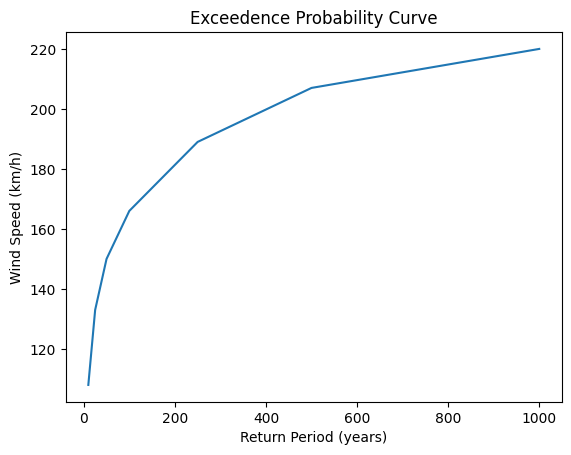

In [71]:
df_pointep = gpd.GeoDataFrame.from_features(results_pointep).set_index('cell_id')

pointep_years = [1/aep for aep in df_pointep.iloc[0]['aeps']]
pointep_winds = df_pointep.iloc[0]['windspeeds']

plt.plot(pointep_years, pointep_winds)
plt.title('Exceedence Probability Curve')
plt.xlabel('Return Period (years)')
plt.ylabel('Wind Speed (km/h)')
plt.show()

The code above converts the `pointep` results to a GeoDataFrame and extracts the years and corresponding windspeeds. It then plots the Exceedence Probability Curve using these values, showing the relationship between the return period (years) and the wind speed (in kilometers per hour).

Executing this code will display the Exceedence Probability Curve, providing insights into the probability of certain wind speeds occurring over different return periods.

## Gate - Circle

The `gate` method in DeepCyc returns TC maximum surface windspeeds for all events crossing or within a specified gate during a given epoch. The gate can be defined as a **line**, a **polygon**, or a **circle**. The values returned by the gate method are 1-minute averaged windspeeds with no terrain correction applied.

To test the usage of the gate method with a circle gate, you can use the following code:

In [75]:
lat_circle = 30
lon_circle = -90
radius_km = 50

results_circle = deepcyc_client.gate('circle', [lat_circle], [lon_circle], radius_km=radius_km)

df_circle = gpd.GeoDataFrame.from_features(results_circle)
df_circle

2023-06-15 15:26:27,272 - INFO - reaskapi.api_client:56 - querying deepcyc/gate took 7049ms


,geometry,event_id,location,windspeed,year_id
0,"POLYGON ((-89.48180 30.00000, -89.48429 29.949...","[d035b43ffbc1a7a47812, 05f55c1703f3f5177133, 6...","[{'coordinates': [-89.840792, 30.492749], 'typ...","[359, 352, 340, 339, 338, 338, 333, 332, 331, ...","[2016_0899_RAN, 1998_0606_RAN, 1998_0980_RAN, ..."


In this example, we define a circle gate with a center latitude of 30 and a center longitude of -90. The radius of the circle gate is set to 50 kilometers. The gate method is called with the gate type as 'circle', followed by the latitude, longitude, and the radius of the circle gate. The resulting data is stored in the results_circle variable.

Similar to the point method the results from gate returns a GeoJSON data structure containing the geometry of the gate, in this case a polygon representing the geodesic circle, and the following properties attributes:

- event_id: list of event ids
- location: list of event coordinates
- windspeed: list of wind speeds
- year_id: list with ids of the years

Let's visualize the spatial distribution of events selected by the circle gate using the Folium package:

In [77]:
from folium import Circle, GeoJson, Map
from folium.plugins.fast_marker_cluster import FastMarkerCluster

# Helper function
def markers_from_df(df):
    lons = [l['coordinates'][0] for l in df.iloc[0]['location']]
    lats = [l['coordinates'][1] for l in df.iloc[0]['location']]
    
    assert len(lats) == len(lons)

    points = []
    for i in range(0, len(lats)):
        points.append([lats[i], lons[i]])

    k = FastMarkerCluster(data=points)
    
    return k

map_circle = Map(location=[lat_circle, lon_circle], zoom_start=8)

# Add a reference circle
circle_ref = Circle(location=(lat_circle, lon_circle), radius=radius_km*1000, color='red')
circle_ref.add_to(map_circle)

# Plot the circle geometry from results
circle_geom = GeoJson(results_circle['features'][0])
circle_geom.add_to(map_circle)

# Plot markers for the wind locations
circle_markers = markers_from_df(df_circle)
circle_markers.add_to(map_circle)

map_circle

In [14]:
map_circle = Map(location=[lat_circle, lon_circle], zoom_start=8)

# Add a reference circle
circle_ref = Circle(location=(lat_circle, lon_circle), radius=radius_km*1000, color='red')
circle_ref.add_to(map_circle)

# Plot the circle geometry from results
circle_geom = GeoJson(results_circle['features'][0])
circle_geom.add_to(map_circle)

# Plot markers for the wind locations
circle_markers = markers_from_df(df_circle)

circle_markers.add_to(map_circle)

map_circle

In this example, we create a Folium map with a specified location and zoom level. The `Map` is used to create the base map, and we set the initial location using the location parameter and the desired zoom level using the zoom_start parameter.

Next, we add a reference circle to the map using the `Circle` class. The location parameter specifies the center of the circle, and the radius parameter is set to the desired radius of the circle in meters. We set the color of the circle to red using the color parameter. The circle is then added to the map using the `add_to` method.

After that, we plot the circle geometry obtained from the `results_circle` using the `GeoJson` class. The circle geometry is added to the map using the add_to method.

To visualize the event locations within the circle gate, we use the `markers_from_df` helper function to convert the DataFrame (`df_circle`) containing the results to a marker cluster. The marker cluster is added to the map using the `add_to` method.

Finally, the map is displayed by executing map_circle.

In [15]:
map_circle_grid = Map(location=[lat_circle, lon_circle])

RKG_RES = 2**-7 + 2**-9

lat_l = [l['coordinates'][1] for l in df_circle.iloc[0]['location']]
lon_l = [l['coordinates'][0] for l in df_circle.iloc[0]['location']]

lat_r = [lat + RKG_RES for lat in lat_l]
lon_u = [lon + RKG_RES for lon in lon_l]

for i in range(0, len(lat_l)):
    lower_left = (lat_l[i], lon_l[i])
    upper_left = (lat_l[i], lon_u[i])
    upper_right = (lat_r[i], lon_u[i])
    lower_right = (lat_r[i], lon_l[i])
    
    edges = [lower_left, upper_left, upper_right, lower_right]
    
    p = Polygon(locations=edges)
    p.add_to(map_circle_grid)
    
map_circle_grid

In this example, we create a Folium map with a specified location and zoom level. The `Map` is used to create the base map, and we set the initial location using the location parameter and the desired zoom level using the zoom_start parameter.

Next, we add a reference circle to the map using the `Circle` class. The location parameter specifies the center of the circle, and the radius parameter is set to the desired radius of the circle in meters. We set the color of the circle to red using the color parameter. The circle is then added to the map using the `add_to` method.

After that, we plot the circle geometry obtained from the `results_circle` using the `GeoJson` class. The circle geometry is added to the map using the add_to method.

To visualize the event locations within the circle gate, we use the `markers_from_df` helper function to convert the DataFrame (`df_circle`) containing the results to a marker cluster. The marker cluster is added to the map using the `add_to` method.

Finally, the map is displayed by executing map_circle.

## Gate - Line Example

In [16]:
lats_line = [28.556358, 28.556358]
lons_line = [-92.770067, -87.070986]

In [17]:
results_line = dc.gate('line', lats_line, lons_line)

2023-06-14 18:28:49,767 - INFO - reaskapi.api_client:56 - querying deepcyc/gate took 15540ms


In [18]:
df_line = gpd.GeoDataFrame.from_features(results_line)

In [19]:
df_line

,geometry,event_id,location,windspeed,year_id
0,"MULTILINESTRING ((-92.77007 28.55636, -87.0709...","[b07114bfa8ddb63fa27c, 96827d18ce9a256720c2, e...","[{'coordinates': [-87.600001, 28.556358], 'typ...","[393, 388, 384, 373, 373, 370, 369, 368, 367, ...","[1990_0706_RAN, 2014_0712_RAN, 1995_0747_RAN, ..."


In [20]:
map_line = Map(location=(np.average(lats_line), np.average(lons_line)))

# Add reference line
line_ref = PolyLine(list(zip(lats_line, lons_line)), color='red')
line_ref.add_to(map_line)

# Add markers for the wind locations
markers_line = markers_from_df(df_line)
markers_line.add_to(map_line)

# Plot the map
map_line

## Gate - Polygon Example

In [21]:
lats_polygon = [29, 30, 30, 29, 29]
lons_polygon = [-91, -91, -90, -90, -91]

In [22]:
results_polygon = dc.gate('polygon', lats_polygon, lons_polygon)

2023-06-14 18:28:57,245 - INFO - reaskapi.api_client:56 - querying deepcyc/gate took 6828ms


In [24]:
df_polygon = gpd.GeoDataFrame.from_features(results_polygon)
df_polygon

,geometry,event_id,location,windspeed,year_id
0,"POLYGON ((-91.00000 29.00000, -91.00000 30.000...","[889ebae0c2236392ee80, 0c1a550c1301e2ea0649, 6...","[{'coordinates': [-90.989703, 29.042901], 'typ...","[360, 359, 353, 349, 344, 341, 338, 338, 338, ...","[2016_0368_RAN, 2014_0799_RAN, 1998_0980_RAN, ..."


In [25]:
map_polygon = Map(location=(np.average(lats_polygon), np.average(lons_polygon)), zoom_start=8)

# Create reference polygon
polygon = Polygon(list(zip(lats_polygon, lons_polygon)), color='red')
polygon.add_to(map_polygon)

# Add markers for the wind positions
markers_polygon = markers_from_df(df_polygon)
markers_polygon.add_to(map_polygon)

map_polygon